In [73]:
import os 
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pdb
from pyarrow import feather
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from scipy import spatial
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import pearsonr as cor

plt.rcParams.update({'font.size': 22})
plt.rcParams["figure.figsize"] = (10, 10)

In [2]:
#move up in directory
os.chdir('../')

from helpers import dot2_

In [3]:
os.getcwd()

'C:\\Users\\Bio_Psych\\Desktop\\Deniz\\tf-cpu\\p1_generalization'

Text(0.5, 0, 'Principal Component')

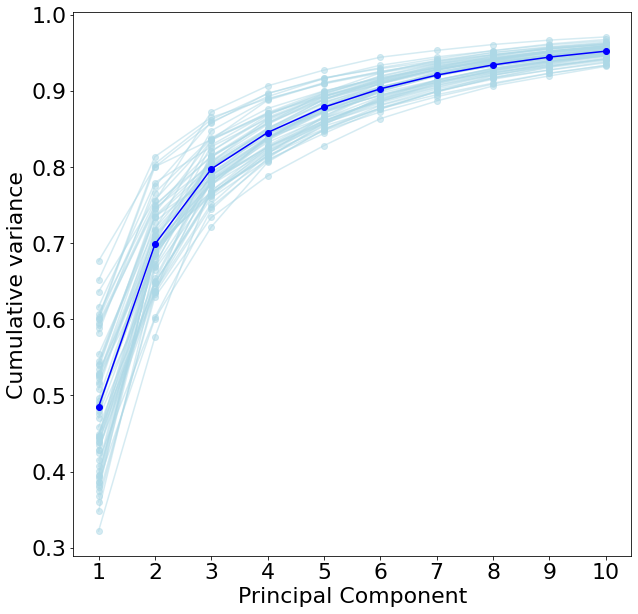

In [54]:
num_hidden = 48
num_ins = 20
n_walks = 3

i = 0
ratios = np.zeros([num_ins * n_walks,48])

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):
        
        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()
        
        

        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  
        pca.fit_transform(st_hidden)
        
        ratios[i, :] = pca.explained_variance_ratio_.cumsum().reshape(1, -1)

        i += 1
        
        # plot individual lines
        plt.plot(pca.explained_variance_ratio_.cumsum()[:10], color = 'lightblue', alpha = 0.5)
        plt.scatter(range(10), pca.explained_variance_ratio_.cumsum()[:10], color = 'lightblue', alpha = 0.5)

# plot mean gray lines
plt.plot(np.mean(ratios, axis = 0)[:10], color = 'blue', zorder=3)
plt.scatter(range(10), np.mean(ratios, axis = 0)[:10], color = 'blue', zorder=3)

plt.xticks(np.arange(10), np.arange(1, 11))
plt.ylabel('Cumulative variance')
plt.xlabel('Principal Component')

# How does the LSTM switch?

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


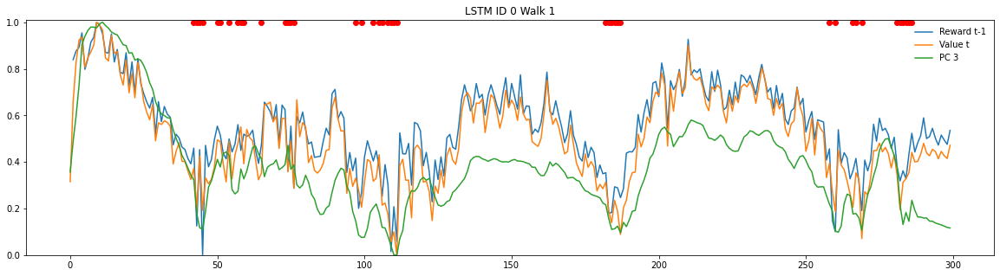

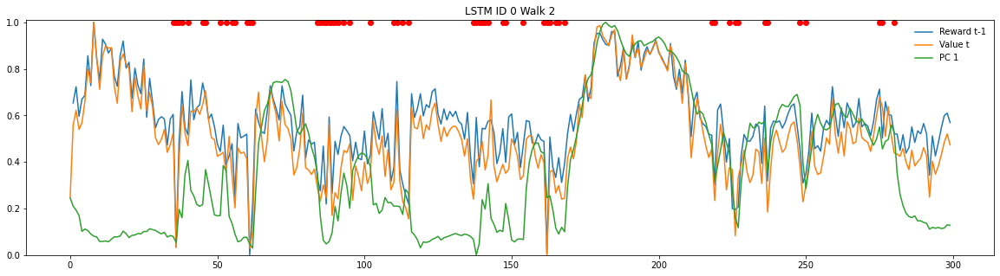

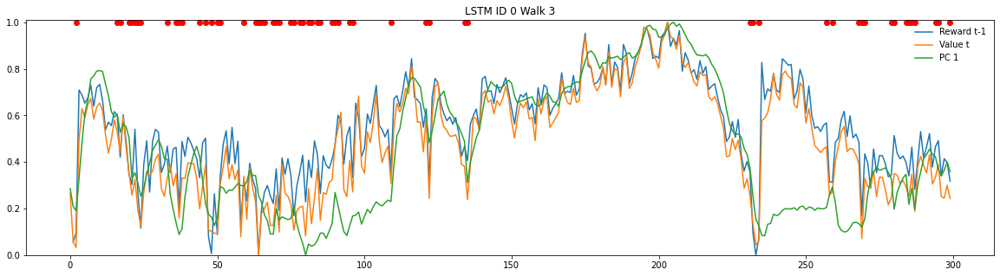

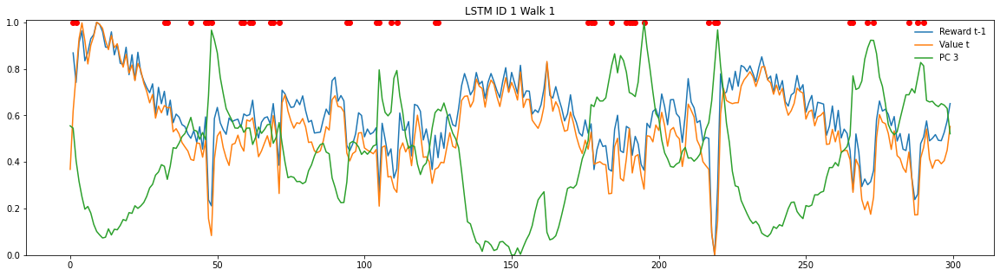

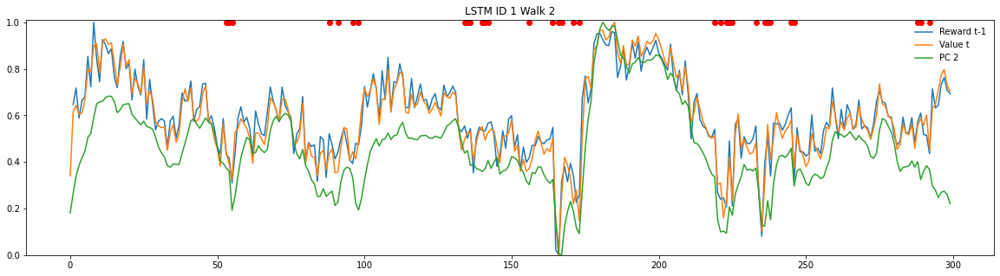

...

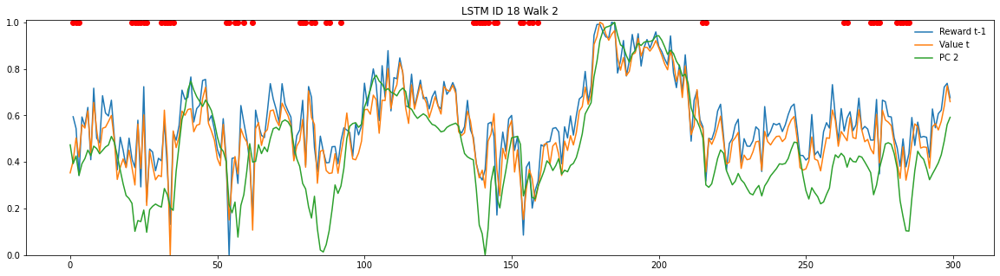

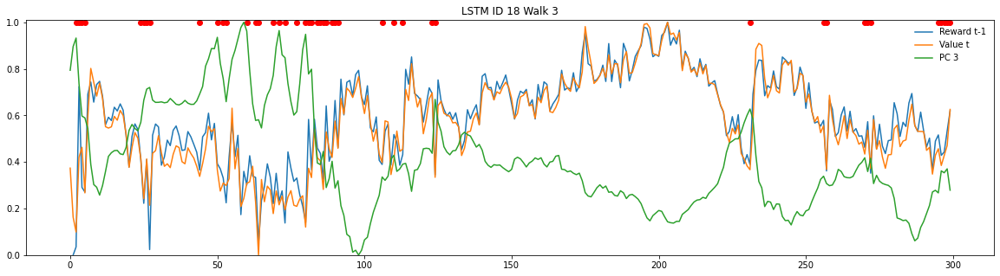

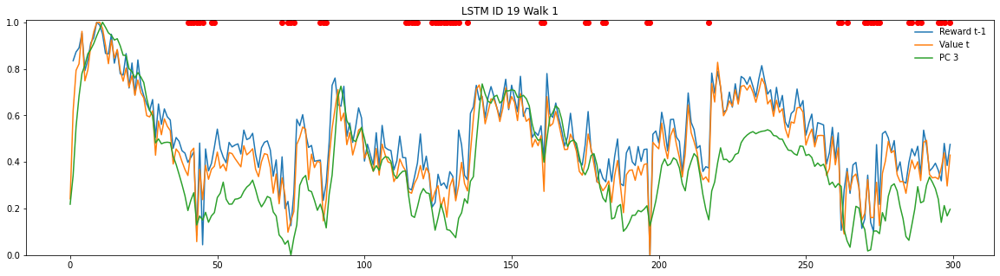

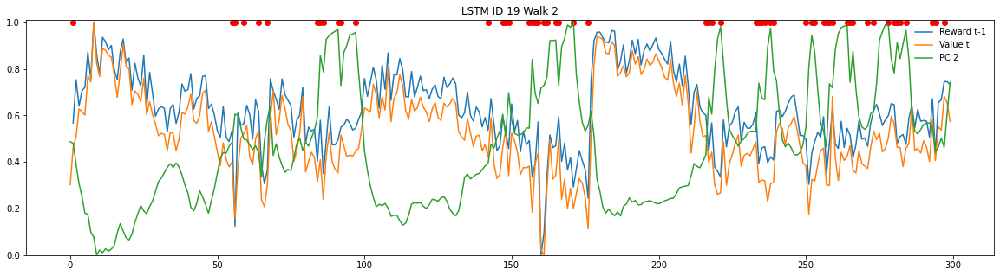

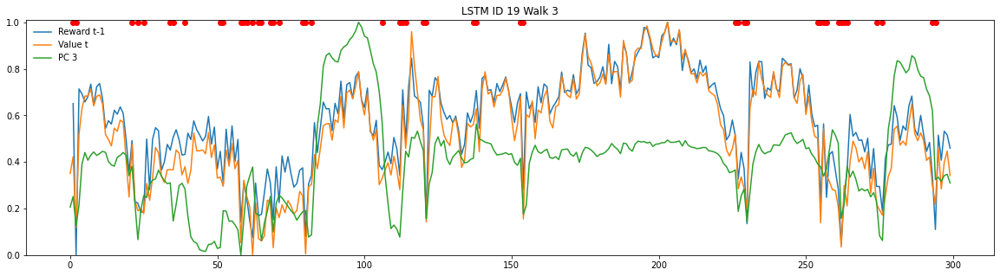

In [176]:
plt.rcParams.update({'font.size': 10})

# calculate moving average
def movingaverage(values, window):
    weights = np.repeat(1.0, window)/window
    smas = np.convolve(values, weights, 'valid')
    return(smas)



for id_ in range(num_ins):
    for walk in range(1, n_walks+1):

        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()



        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  
        pca.fit_transform(st_hidden)


        # find pc that correlates with switches
        coefs = np.zeros(3)
        for pc_i in range(3):
            coef = cor(pca.fit_transform(st_hidden)[:,pc_i], df['is_switch'])
            coefs[pc_i] = coef[0]
            best_pc = np.argmax(np.abs(coefs))

        # scale reward and values
        scaled_rewards =  MinMaxScaler().fit_transform(df['reward'].values.reshape(-1,1))
        scaled_values =  MinMaxScaler().fit_transform(df['value'].values.reshape(-1,1))
        scaled_pc = MinMaxScaler().fit_transform(pca.fit_transform(st_hidden)[:,best_pc].reshape(-1,1))
        #mavg = movingaverage(scaled_rewards.flatten(), 2)


        # plotting
        plt.figure(figsize = [20, 5])

        plt.ylim((0,1.01))
        plt.scatter(range(len(df['is_switch'])), [None if i != 1 else i for i in df['is_switch'].values], color = 'red')
        plt.plot(pd.Series(scaled_rewards.flatten()).shift(1), label = 'Reward t-1')
        plt.plot(scaled_values, label = 'Value t')
        plt.plot(scaled_pc, label = 'PC {}'.format(best_pc+1))
        plt.title('LSTM ID {} Walk {}'.format(id_, walk))

        plt.legend(frameon = False)


In [177]:
# correlations

cor(df['reward'].shift(1)[1:], df['is_switch'][1:])

cor(df['reward'].shift(1)[1:], df['value'][1:])

cor(scaled_pc.flatten(), df['value'])

(0.4864631274822588, 3.1550522243351713e-19)

# Logistic Regressions

In [224]:
import statsmodels.api as sm
import ptitprince as pt


logit_beta_prev_reward = np.zeros(num_ins*n_walks)
logit_beta_value = np.zeros(num_ins*n_walks)
logit_beta_pc = np.zeros(num_ins*n_walks)

i = 0

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):

        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()

        
        # reward t-1
        scaled_rewards =  MinMaxScaler().fit_transform(df['reward'].values.reshape(-1,1))
        logit_mod = sm.Logit(df['is_switch'][1:], pd.Series(scaled_rewards.flatten()).shift(1)[1:])
        logit_res = logit_mod.fit()
        logit_beta_prev_reward[i] = logit_res.params[0]
        
        # value t
        scaled_values =  MinMaxScaler().fit_transform(df['value'].values.reshape(-1,1))
        logit_mod = sm.Logit(df['is_switch'], scaled_values)
        logit_res = logit_mod.fit()
        logit_beta_value[i] = logit_res.params[0]
        
        # PC max correlation with switches
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  
        pca.fit_transform(st_hidden)


        # find pc that correlates with switches
        coefs = np.zeros(3)
        for pc_i in range(3):
            coef = cor(pca.fit_transform(st_hidden)[:,pc_i], df['is_switch'])
            coefs[pc_i] = coef[0]
            best_pc = np.argmax(np.abs(coefs))
        
        scaled_pc = MinMaxScaler().fit_transform(pca.fit_transform(st_hidden)[:,best_pc].reshape(-1,1))
        
        logit_mod = sm.Logit(df['is_switch'], scaled_pc)
        logit_res = logit_mod.fit()
        logit_beta_pc[i] = logit_res.params[0]
        
        i += 1 
        

Optimization terminated successfully.
         Current function value: 0.314548
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.313427
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.324158
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.418854
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.409418
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.454929
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.406461
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.388564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.417328
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.356717
  

Optimization terminated successfully.
         Current function value: 0.306530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.306068
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.305530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.310490
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.318644
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.311973
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.334239
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.308841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.285901
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.503280
  

In [225]:
# plotting

plot_df = pd.DataFrame({"coeffs": np.array([logit_beta_prev_reward] + [logit_beta_value] + [logit_beta_pc]).flatten(),
                       "type": ['reward t-1'] * len(logit_beta_prev_reward)  + ['value t'] * len(logit_beta_value)
                        + ['PC *'] * len(logit_beta_pc)})

Text(0.5, 0, '')

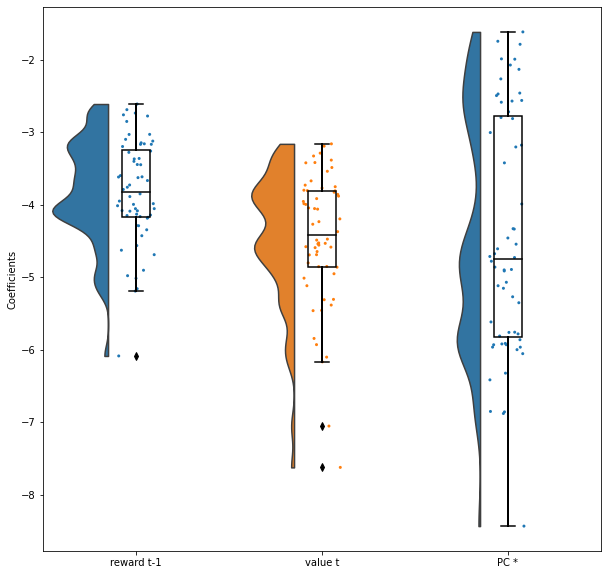

In [226]:
# plotting the clouds
f, ax = plt.subplots(figsize=(10, 10))
dy="coeffs"; dx="type"; ort="v"; pal = sns.color_palette(n_colors=2)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


#pal1 = {"LSTM": "blue", "Human": "black"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal, edgecolor = "white",
size = 3, jitter = 1, zorder = 0, orient = ort)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Coefficients')
plt.xlabel('')

# How do humans switch?

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set 

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set 

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set 

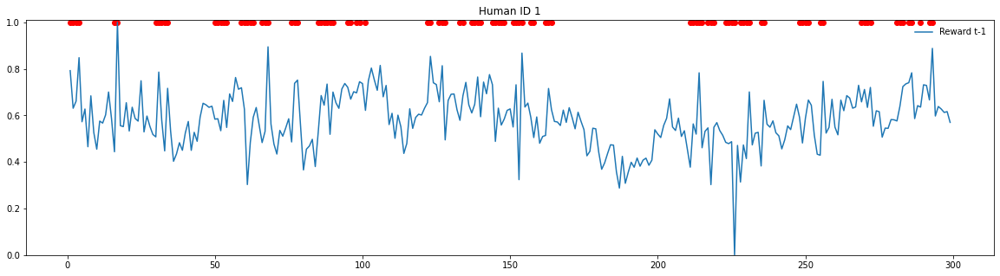

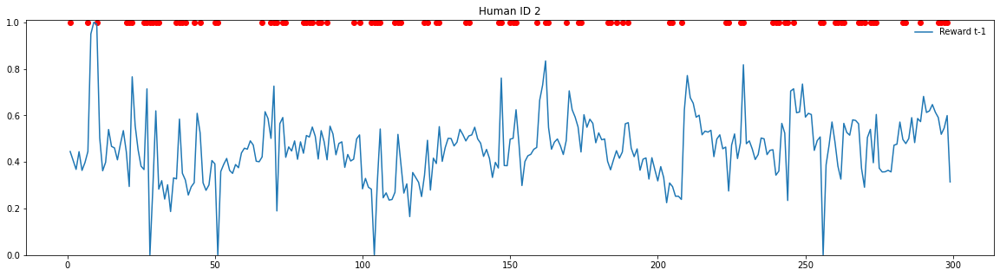

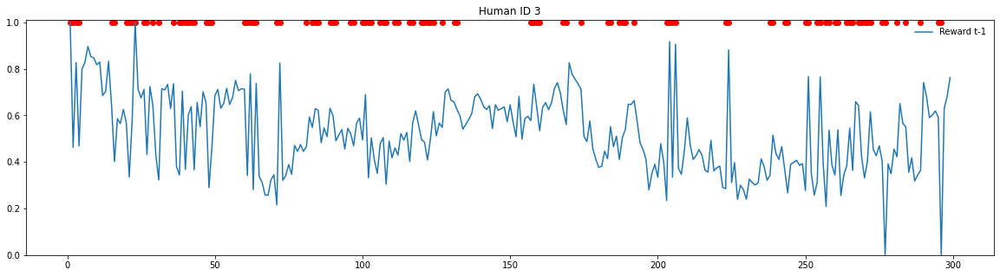

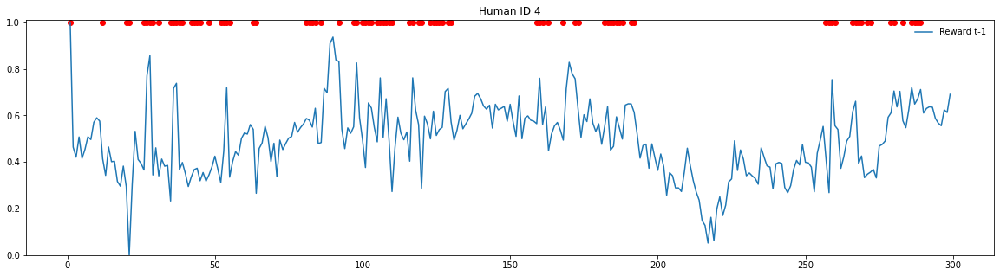

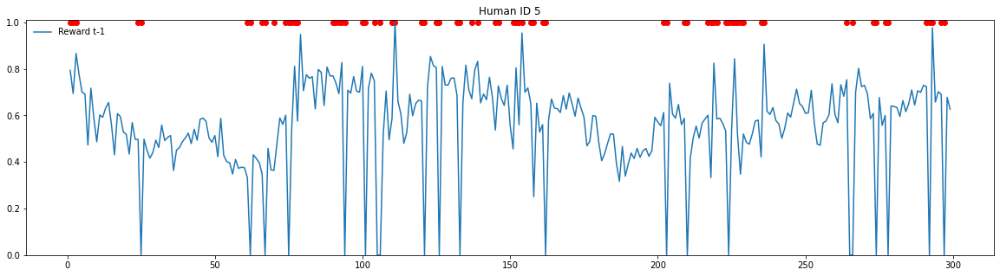

...

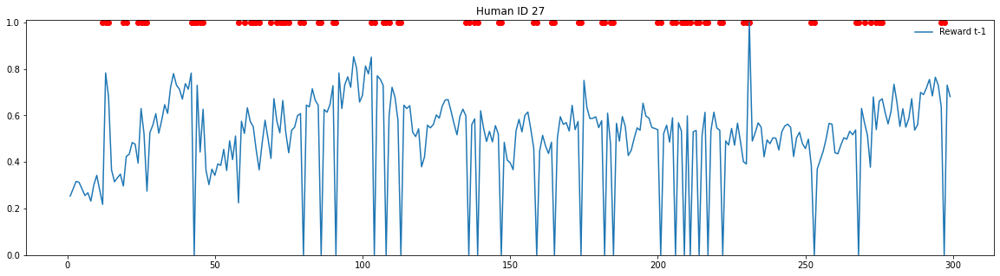

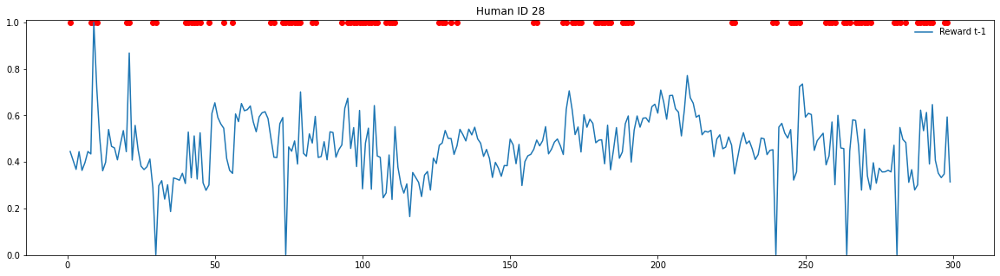

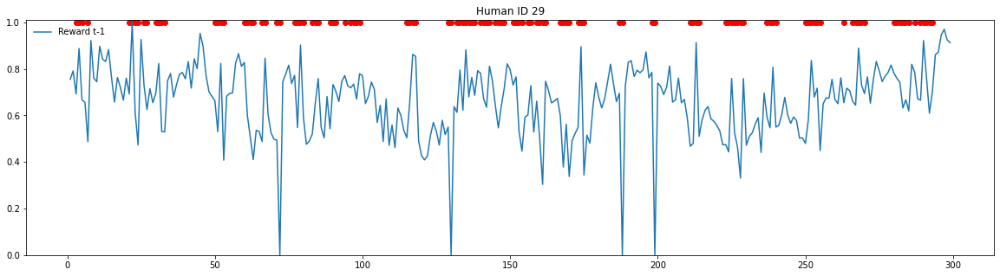

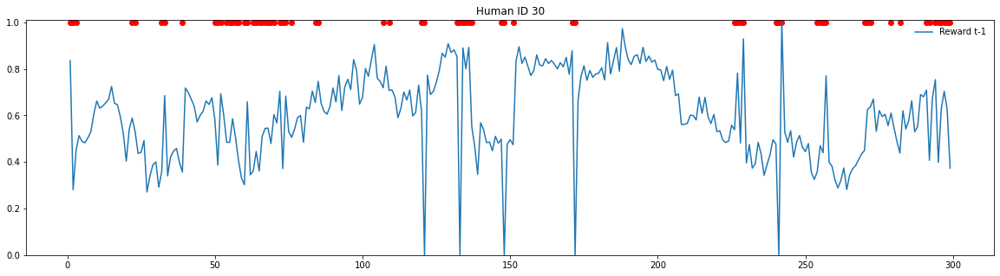

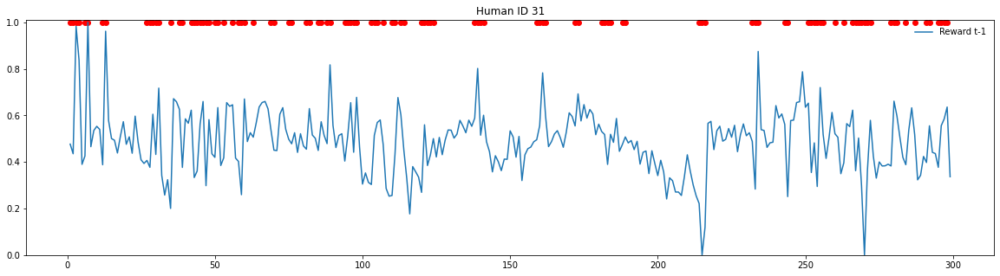

In [260]:
path_to_data = 'data/human_raw_data/'
data_file = 'data_chakroun_wiehler.csv'
human_df = pd.read_csv(open(path_to_data + data_file, 'rb'), index_col=0)

for sub in range(1,32):
    
    temp_df = human_df[human_df['vp'].values==sub]
    # change human data to get function to work
    temp_df.columns = ['study', 'vp', 'p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4', 'choice', 'rt']
    temp_df['choice'] = temp_df['choice'].values - 1
    temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']] = temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']].values/100
    
    df = temp_df 
    
    # get chosen reward # remove misses 
    df['reward'] = [[p1,p2,p3,p4][ch-1] if ch != -1 else 0 for ch, p1, p2, p3, p4 in zip(temp_df['choice'], temp_df['p_rew_1'], temp_df['p_rew_2'], temp_df['p_rew_3'], temp_df['p_rew_4'])]

    
     # scale reward and values
    scaled_rewards =  MinMaxScaler().fit_transform(df['reward'].values.reshape(-1,1))
    
    # is switch # remove misses 
    is_switch = [int(df['choice'].values[t] != df['choice'].values[t-1]) for t in range(1, len(df.choice))]
    is_switch = np.insert(is_switch, 0, 0) # insert leading 0, first element can't be switch


    # plotting
    plt.figure(figsize = [20, 5])

    plt.ylim((0,1.01))
    plt.scatter(range(len(is_switch)), [None if i != 1 else i for i in is_switch], color = 'red')
    plt.plot(pd.Series(scaled_rewards.flatten()).shift(1), label = 'Reward t-1')
    plt.title('Human ID {}'.format(sub))

    plt.legend(frameon = False)


In [280]:
human_df = pd.read_csv(open(path_to_data + data_file, 'rb'), index_col=0)

logit_beta_prev_reward_human = np.zeros(31)

i = 0

for sub in range(1,32):
    
    temp_df = human_df[human_df['vp'].values==sub]
    # change human data to get function to work
    temp_df.columns = ['study', 'vp', 'p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4', 'choice', 'rt']
    temp_df['choice'] = temp_df['choice'].values - 1
    temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']] = temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']].values/100
    
    df = temp_df 
    
    # get chosen reward # remove misses 
    df['reward'] = [[p1,p2,p3,p4][ch-1] if ch != -1 else 0 for ch, p1, p2, p3, p4 in zip(temp_df['choice'], temp_df['p_rew_1'], temp_df['p_rew_2'], temp_df['p_rew_3'], temp_df['p_rew_4'])]

    
     # scale reward
    scaled_rewards =  MinMaxScaler().fit_transform(df['reward'].values.reshape(-1,1))
    
    # shift rewards
    shifted_rewards = pd.Series(scaled_rewards.flatten()).shift(1)[1:].values
    shifted_rewards[shifted_rewards==0] = np.nan # exclude 0 rewards of missing trials
    
    # is switch  
    is_switch = [int(df['choice'].values[t] != df['choice'].values[t-1]) for t in range(1, len(df.choice))]
    is_switch = np.insert(is_switch, 0, 0) # insert leading 0, first element can't be switch

    # reward t-1 # missing
    logit_mod = sm.Logit(is_switch[1:], shifted_rewards, missing = 'drop')
    logit_res = logit_mod.fit()
    logit_beta_prev_reward_human[i] = logit_res.params[0]

    i += 1 

Optimization terminated successfully.
         Current function value: 0.647178
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.629302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649608
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.627418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.514788
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644898
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.668605
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.584018
  

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_

In [282]:
# plotting

plot_df = pd.DataFrame({"coeffs": logit_beta_prev_reward_human,
                       "type": ['reward t-1'] * len(logit_beta_prev_reward_human)})

Text(0.5, 0, '')

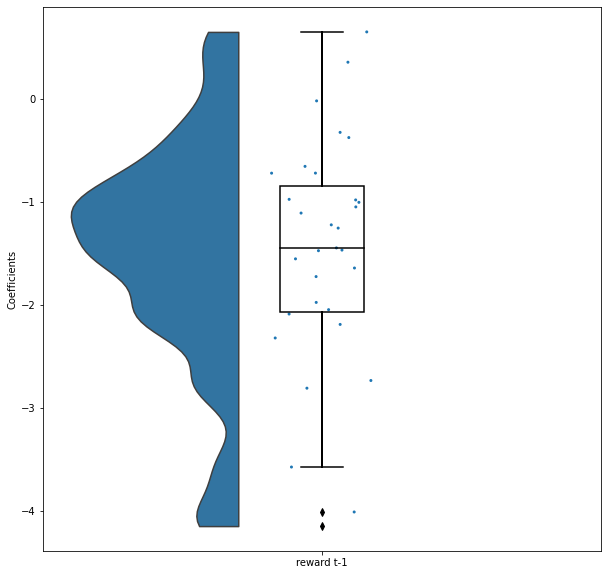

In [283]:
# plotting the clouds
f, ax = plt.subplots(figsize=(10, 10))
dy="coeffs"; dx="type"; ort="v"; pal = sns.color_palette(n_colors=2)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


#pal1 = {"LSTM": "blue", "Human": "black"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal, edgecolor = "white",
size = 3, jitter = 1, zorder = 0, orient = ort)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Coefficients')
plt.xlabel('')